# Computer Vision - P3

## Delivery

Your overall grading will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented exhaustively and in **English**. 

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Answers to questions also need to be in **English**.

- Make sure to print and plot exactly what it is indicated. If a reference image is provided, your output is expected to be exactly the same unless instructed differently. 

- The deliverable of both parts must be a file named **P3_Student1_Student2.zip** that includes:
    - The notebook P3_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
    - All the images used in this notebook (upload the ones that were not provided)
    
- It is required that your code can be run by us without need of any modification and without getting any errors.

- Use packages and solutions that were covered in your class and tutorials. If you are unsure about using a particular package, you should seek clarification from your instructor to confirm whether it is allowed.

- Please refrain from utilizing resources like ChatGPT to complete this lab assignment.

**Deadline (Campus Virtual): Group A & F: November 14th, 23:00 h; Group B: November 14th, 23:00 h** 

==============================================================================================
## Practicum 3: Image and Video Segmentation

==============================================================================================

The main topics of Laboratory 3 are:

3.1. Segmentation of video shots with static scenes.

3.2. Background subtraction.

3.3. Segmentation of images.

The following chapters of the book “Computer Vision: Algorithms and Applicatons” from Richard Szeliski have further information about the topic:

* Chapter 4: Computer Vision: Algorithms and Applications.

* Chapter 5: Segmentation.



In [167]:
# Example
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.color import rgb2gray, gray2rgb
from skimage import util, img_as_float


## 3.1 Segmentation of images

Apply the image segmentation methods (Felzenswhalbs, Slic and Quickshift) based on the clustering of points corresponding to the pixels but in the feature space RGB-XY space.

**Hint**: 
- Different image segmentation commands can be found in skimage.segmentation.
- Use the function segmentation.mark_boundaries for seeing the boundaries of the segments.
- Use the inline pluggin to visualize images (%matplotlib inline).

<img src="images_notebook/image_Segmentation.png" width=600>

### Felzenszwalb's efficient graph based segmentation

#### a) Read 'barcelona.jpeg' image from the folder 'images' and segment it using the Felzenszwalbs's method. Comment the result.

(-0.5, 999.5, 666.5, -0.5)

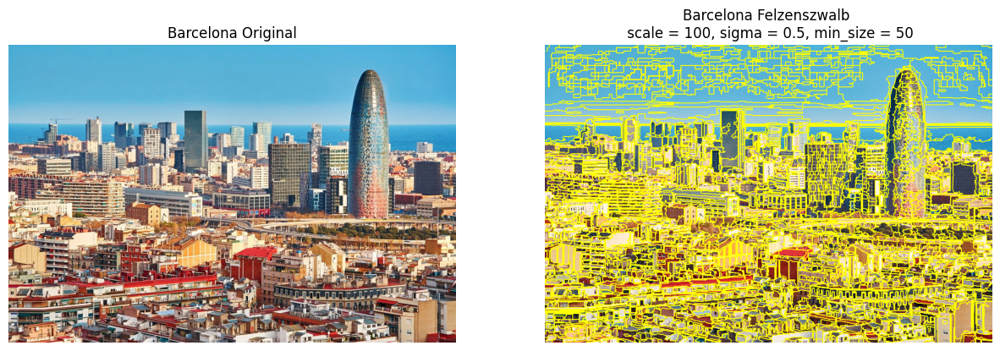

In [132]:
# Your solution here
%matplotlib inline
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries

# setting the figure size as 15, 15
plt.figure(figsize=(15,15))

# read the image
barcelona = io.imread("images_notebook/barcelona.jpeg")

barcelona_segmented = felzenszwalb(barcelona, scale=100, sigma=0.5, min_size=50)

# plotting the original image
plt.subplot(1,2,1)
plt.imshow(barcelona)
plt.title("Barcelona Original")
plt.axis('off')

# Marking the bounderies
plt.subplot(1,2,2)
barcelona_felzenszwalb_boundaries = mark_boundaries(barcelona, barcelona_segmented)
plt.imshow(barcelona_felzenszwalb_boundaries)
plt.title("Barcelona Felzenszwalb \n scale = 100, sigma = 0.5, min_size = 50")
plt.axis('off')

#### b) Create a function where you explore at least 3 different parameter combinations in order to obtain a better image segmentation. Your function should receive the image and the set of parameters you would like to change. It should also resize your image to be a third part of the original image size. Your function results should be a visualization of the results and a print of the number of segments.  


Answer the following questions:
- **Is it critical to convert the image in grayscale in order to do the image segmentation?**
    - It's not critical because the Felzenszwalb's efficient graph is a 2D segmentation algorithm.</p>

- **Is it critical to convert the image in float in order to do the image segmentation?**
    - Converting to float is a common preprocessing step for normalization, which can improve the performance of many segmentation algorithms, but it's not always a strict requirement.</p>

- **Which are the optimal values according to your subjective perception?**
    - If we want more segments, a larger scale would be great. On the other hand, a low sigma is always better for not losing details of well-defined structures. In our subjective point of view the best result is the intermediate one scale=200, sigma=0.7, min_size=100. we can see that it marks with very detail but not so much like in the first one. It marks building's details good and doesn't divide que sky so much as in the first, or the third.</p>

- **How does each parameter behave?**
    - Scale influences the segment size.
    - Sigma is the diameter of a Gaussian kernel.
    - Min_size is for setting the minimum size component.</p>
    
- **Does the image reduction affect the optimal values?**
    - Reducing the image size can necessitate different optimal parameter values, as it changes the resolution and detail level of the image, impacting the segmentation results.</p>


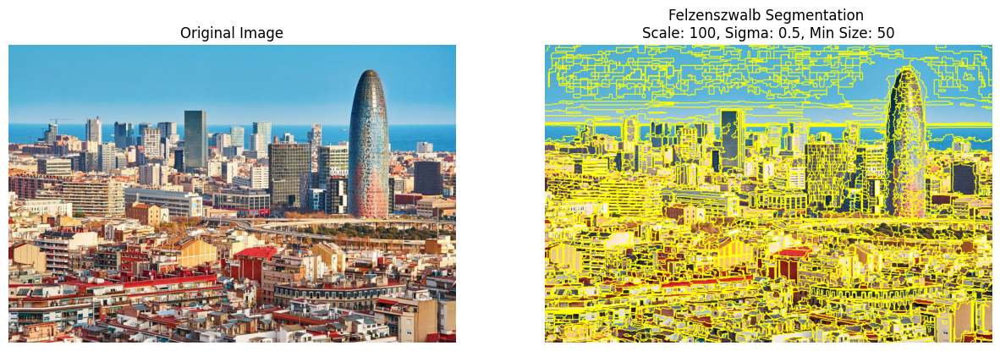

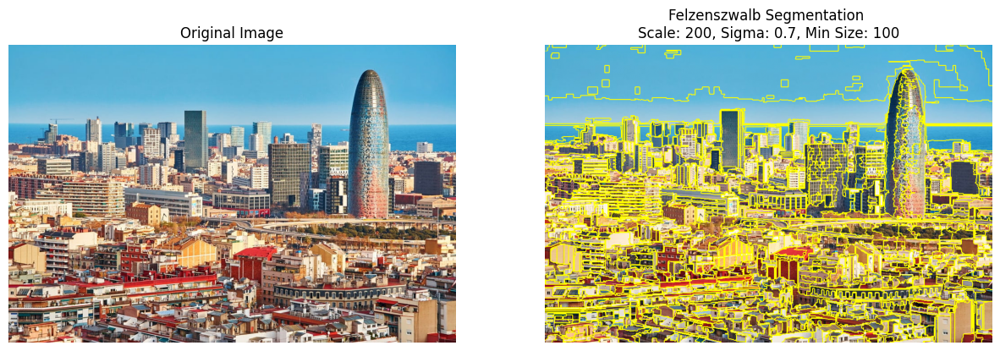

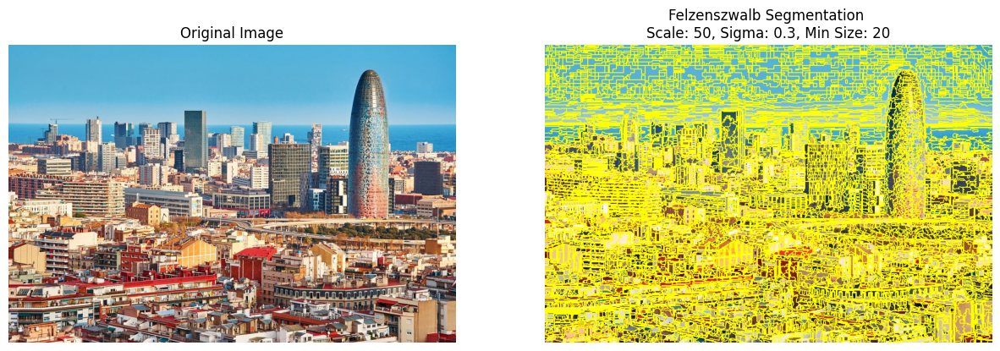

In [133]:
%matplotlib inline
from skimage import io, segmentation
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

def segment_and_visualize(image_path, scale, sigma, min_size):
    # Read the image
    image = io.imread(image_path)

    # Apply Felzenszwalb segmentation with the specified parameters
    segmented_image = segmentation.felzenszwalb(image, scale=scale, sigma=sigma, min_size=min_size)

    # Plotting the original and segmented images
    plt.figure(figsize=(15, 7))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')

    # Marking the boundaries on the original image
    plt.subplot(1, 2, 2)
    boundaries = mark_boundaries(image, segmented_image)
    plt.imshow(boundaries)
    plt.title(f"Felzenszwalb Segmentation \nScale: {scale}, Sigma: {sigma}, Min Size: {min_size}")
    plt.axis('off')

    plt.show()

# Example usage with different parameter combinations
segment_and_visualize("images_notebook/barcelona.jpeg", scale=100, sigma=0.5, min_size=50)
segment_and_visualize("images_notebook/barcelona.jpeg", scale=200, sigma=0.7, min_size=100)
segment_and_visualize("images_notebook/barcelona.jpeg", scale=50, sigma=0.3, min_size=20)


#### c) Comment the definition of the algorithm (use approximately 3 lines at most), its advantages and disadvantages.

The algorithm computes Felsenszwalb’s efficient graph based image segmentation. It produces an oversegmentation of a multichannel (i.e. RGB) image using a fast, minimum spanning tree based clustering on the image grid.

### SLIC - K-Means based image segmentation
#### d) Segment the same image using the SLIC image segmentation algorithm using the parameters by default. 

(-0.5, 999.5, 666.5, -0.5)

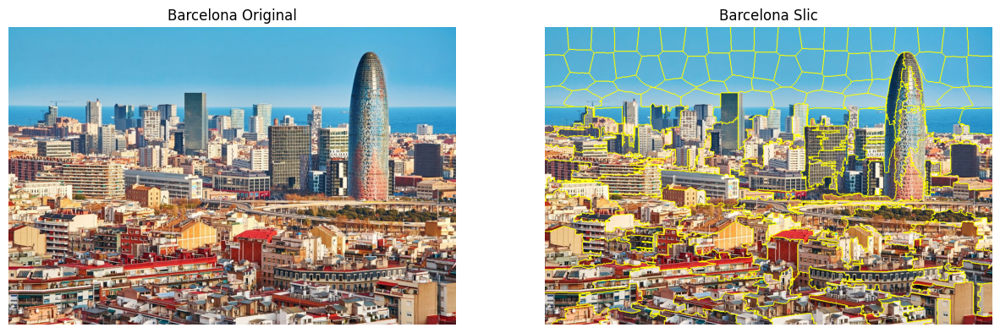

In [43]:
# Your solution here
%matplotlib inline
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries

# setting the figure size as 15, 15
plt.figure(figsize=(15,15))

# read the image
bar = io.imread("images_notebook/barcelona.jpeg")

bar_segmented = slic(bar, n_segments=250, compactness=10, sigma=1, start_label=1)

# plotting the original image
plt.subplot(1,2,1)
plt.imshow(bar)
plt.title("Barcelona Original")
plt.axis('off')

# Marking the bounderies
plt.subplot(1,2,2)
bar_slic_boundaries = mark_boundaries(bar, bar_segmented)
plt.imshow(bar_slic_boundaries)
plt.title("Barcelona Slic")
plt.axis('off')

Create a function where you explore at least 3 different parameter combinations in order to obtain a better image segmentation. Your function should receive the image and the set of parameters you would like to change. It should also resize your image to be a third part of the original image size. Your function results should be a visualization of the results and a print of the number of segments.  


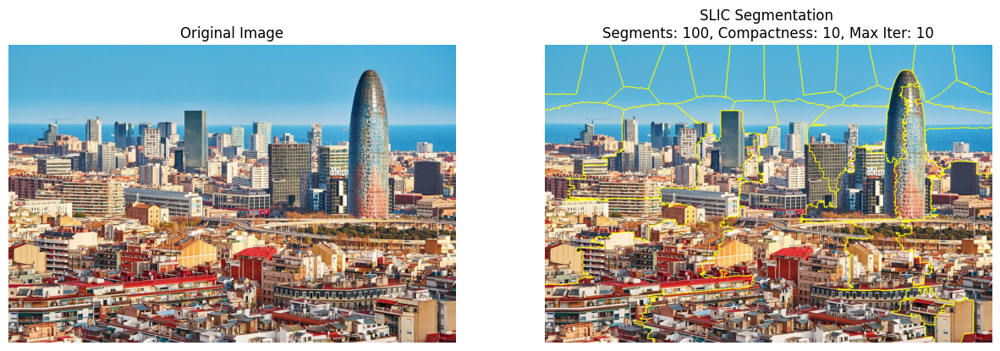

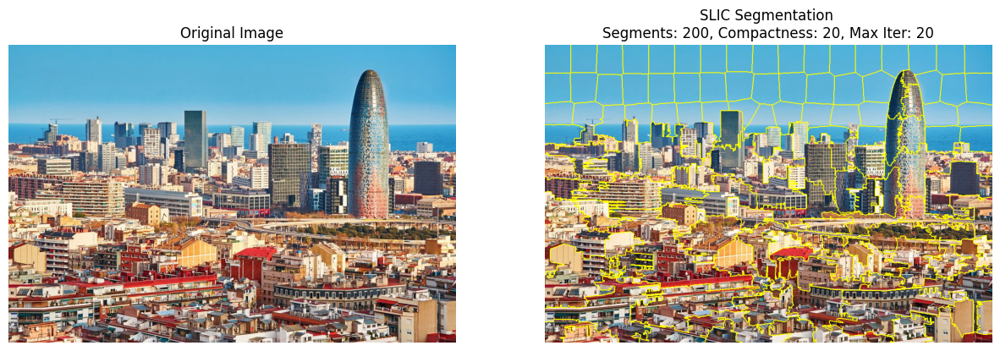

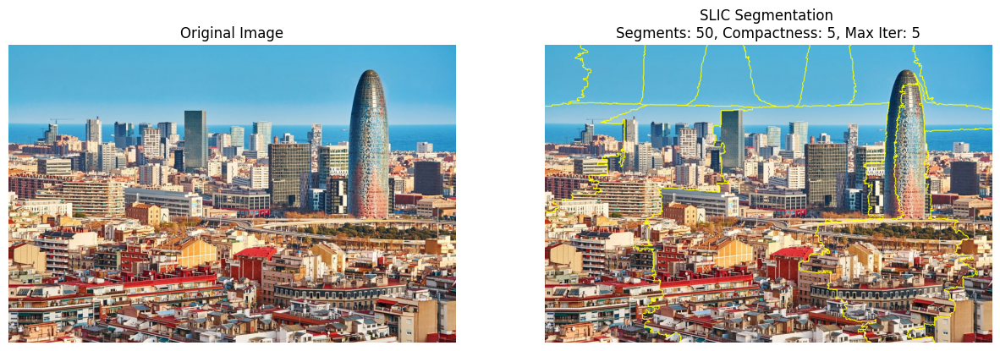

In [44]:
# Your solution here
%matplotlib inline
from skimage import io, segmentation
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

def segment_and_visualize_slic(image_path, n_segments, compactness, max_iter):
    # Read the image
    image = io.imread(image_path)

    # Apply SLIC segmentation with the specified parameters
    # segmented_image = segmentation.slic(image, n_segments=n_segments, compactness=compactness) 
    segmented_image = segmentation.slic(image, n_segments=n_segments, compactness=compactness, max_iter=max_iter)
    
    # Plotting the original and segmented images
    plt.figure(figsize=(15, 7))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')

    # Marking the boundaries on the original image
    plt.subplot(1, 2, 2)
    boundaries = mark_boundaries(image, segmented_image)
    plt.imshow(boundaries)
    plt.title(f"SLIC Segmentation \nSegments: {n_segments}, Compactness: {compactness}, Max Iter: {max_iter}")
    plt.axis('off')

    plt.show()

# Example usage with different parameter combinations for SLIC segmentation
segment_and_visualize_slic("images_notebook/barcelona.jpeg", n_segments=100, compactness=10, max_iter=10)
segment_and_visualize_slic("images_notebook/barcelona.jpeg", n_segments=200, compactness=20, max_iter=20)
segment_and_visualize_slic("images_notebook/barcelona.jpeg", n_segments=50, compactness=5, max_iter=5)


#### f) Comment what the algorithm is (in up to 3 lines).

This algorithm simply performs K-means in the 5d space of color information and image location and is therefore closely related to quickshift. As the clustering method is simpler, it is very efficient. It is essential for this algorithm to work in Lab color space to obtain good results.

### Quickshift image segmentation

#### g) Segment the original image using the Quickshift algorithm. 

Create a loop where you explore kernel_size variations in order to obtain a better image segmentation. Argument why a higher or lower value improves the segmentation results. 


(-0.5, 999.5, 666.5, -0.5)

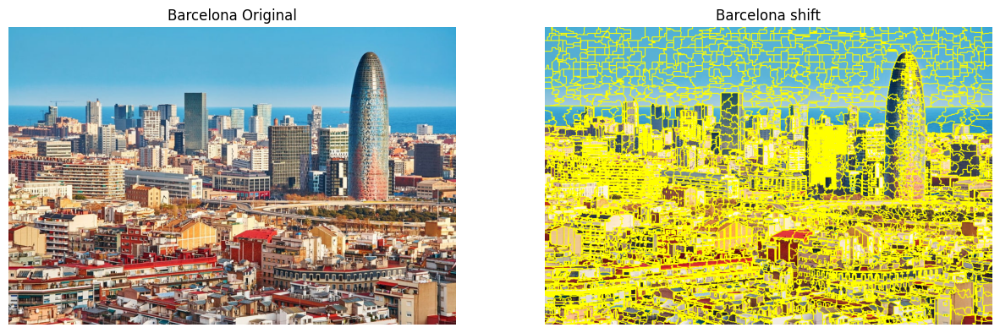

In [45]:
# Your solution here
%matplotlib inline
from skimage.segmentation import quickshift
from skimage.segmentation import mark_boundaries

# setting the figure size as 15, 15
plt.figure(figsize=(15,15))

# read the image
bar = io.imread("images_notebook/barcelona.jpeg")

bar_segmented = quickshift(bar, kernel_size=3, max_dist=6, ratio=0.5)
# plotting the original image
plt.subplot(1,2,1)
plt.imshow(bar)
plt.title("Barcelona Original")
plt.axis('off')

# Marking the bounderies
plt.subplot(1,2,2)
bar_quickshift_boundaries = mark_boundaries(bar, bar_segmented)
plt.imshow(bar_quickshift_boundaries)
plt.title("Barcelona shift")
plt.axis('off')

#### h) Comment what the algorithm is (in up to 3 lines).

Quickshift is a relatively recent 2D image segmentation algorithm, based on an approximation of kernelized mean-shift. Therefore it belongs to the family of local mode-seeking algorithms and is applied to the 5D space consisting of color information and image location.

One of the benefits of quickshift is that it actually computes a hierarchical segmentation on multiple scales simultaneously.

### Comparison of segmentation algorithms

Apply the best set of parameters of each algorithm and apply it to: 
1) Original image
1) Salt and pepper noise version of this image
2) Flipped image (horizontally)
3) Canny edge detector result of this image. 

Plot the image and its results of fezenswalb and SLIC algorithm in a 1x3 subplots. 

In [162]:
# Your solution here

# with this funcion we apply the 2 segmentation methods 
# and display the results in a 1x3 subplot
# boundaries color is yellow by default
def apply_segmentation(image, type_image, color_boundaries=[1,1,0]):

        image_segmented = segmentation.slic(image, n_segments=200, compactness=20) 
        image_slic_boundaries = mark_boundaries(image, image_segmented, color=color_boundaries)

        image_segmented = segmentation.felzenszwalb(image, scale=500, sigma=0.8, min_size=200)
        image_felzenszwalb_boundaries = mark_boundaries(image, image_segmented, color=color_boundaries)

        fig = plt.figure(figsize=(15,15))

        ax = fig.add_subplot(1,3,1)
        plt.imshow(image)
        ax.title.set_text("Bcn Original " + str(type_image))
        ax.axis('off')

        ax = fig.add_subplot(1,3,2)
        plt.imshow(image_felzenszwalb_boundaries)
        ax.title.set_text("Bcn Felzenszwalbs " + str(type_image))
        ax.axis('off')

        ax = fig.add_subplot(1,3,3)
        plt.imshow(image_slic_boundaries)
        ax.title.set_text("Bcn SLIC " + str(type_image))
        ax.axis('off')


In [179]:
# when we use canny we get an image with dtype = bool
# this function transforms the bool image into a uint8 image with 3 channels
def bool2rgb(boolean_image):
    # Define colors for true and false values
    true_color = np.array([255, 255, 255])  # White
    false_color = np.array([0, 0, 0])      # Black

    # Use broadcasting to create the RGB image
    rgb_image = np.zeros(boolean_image.shape + (3,), dtype=np.uint8)
    rgb_image[boolean_image] = true_color
    rgb_image[~boolean_image] = false_color

    return rgb_image

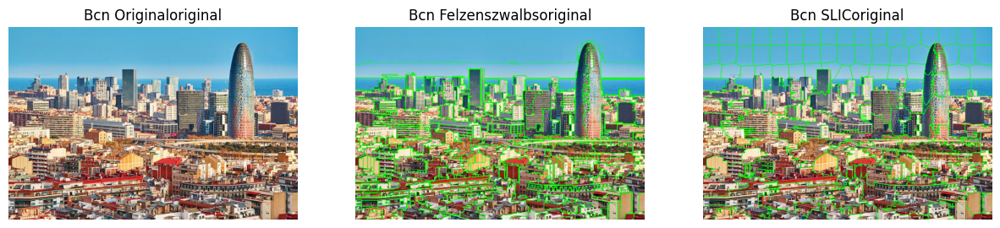

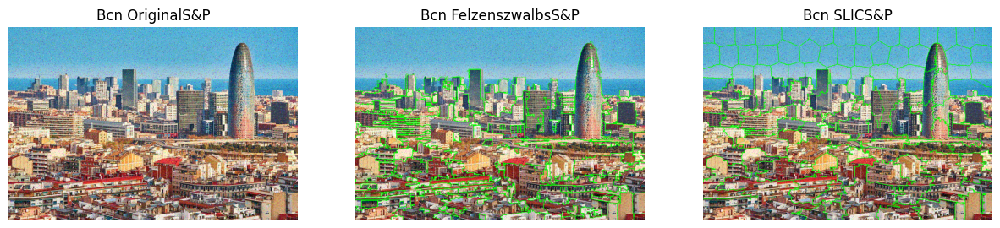

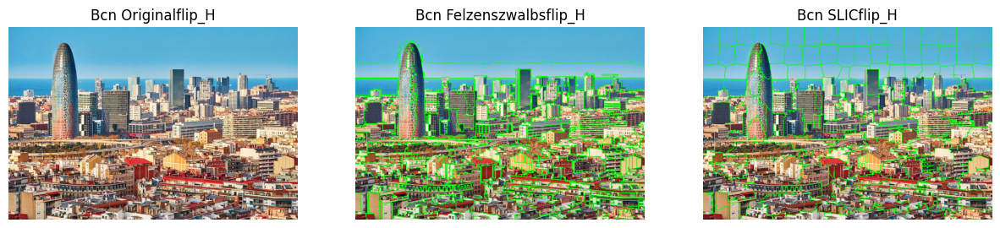

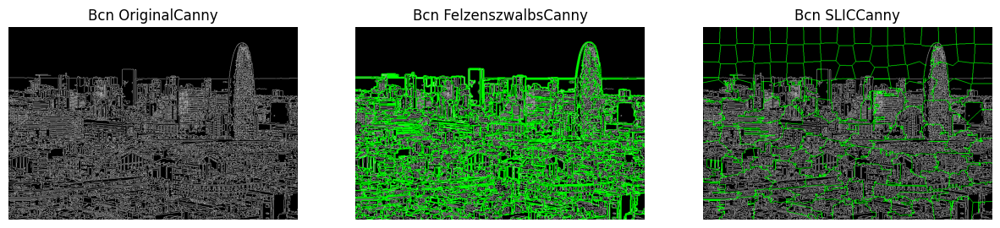

In [178]:
from skimage.transform import rotate
from skimage.feature import canny

# Convert image to float [0, 1] as it's better for noise addition and edge detection
barcelona_float = img_as_float(barcelona)

# 1. Add Salt and Pepper Noise
# The amount parameter controls the proportion of pixels affected.
barcelona_noise = util.random_noise(barcelona_float, mode='s&p', amount=0.05)

# 2. Flip Image Horizontally
barcelona_flipped = np.fliplr(barcelona_float)

# 3. Apply Canny Edge Detection
# Convert to grayscale as Canny requires a single channel image.
barcelona_gray = rgb2gray(barcelona_float)
barcelona_canny = canny(barcelona_gray)
# Convert grayscale image from Canny to RGB in order to use mark_boundaries
barcelona_canny_rgb = bool2rgb(barcelona_canny)

apply_segmentation(barcelona, "original", [0,1,0]) # original
apply_segmentation(barcelona_noise, "S&P", [0,1,0]) # salt and pepper
apply_segmentation(barcelona_flipped, "flip_H", [0,1,0]) # flipped horizontally
apply_segmentation(barcelona_canny_rgb, "Canny", [0,1,0]) # canny

- **Do the transformations affect the segmentation? Why or why not?** 
    - Yes, transformations can affect segmentation. Adding salt and pepper noise can introduce additional small segments due to the presence of noise pixels that do not correspond to actual object boundaries. Flipping the image horizontally shouldn't affect the segmentation significantly if the algorithm is orientation-invariant. However, the Canny edge detector result will greatly affect segmentation because it only retains edge information, potentially leading to over-segmentation where the edges are detected as boundaries.</p>
- **Can the number of segments can be used as a criterion for the performance of the algorithms?**
    - The number of segments alone is not a robust criterion for performance because it doesn't account for the accuracy or relevance of the segmentation.

## 3.2 Segmentation via clustering

In this exercise, you will implement hierarchical clustering to segment the "images_notebook/loro.png" image in gray scales. First load and visualize the image, then implement hierarchical clustering over the pixels and plot the final results side by side to the original image

Hint: Sklearn has a hierarchical clustering implementation you should use. Reshape your dataset such that you have a 2 dimensional array. Use linkage "ward" and grid_to_graph function for the connectivity parameter. 

<img src="images_notebook/loro_segmentation.jpg" width=600>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


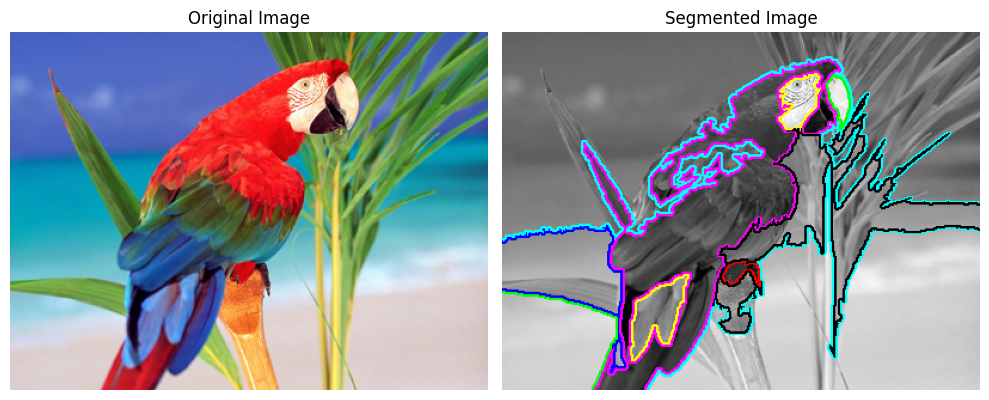

In [73]:
# Your solution here
from sklearn.cluster import AgglomerativeClustering
from sklearn.feature_extraction.image import grid_to_graph
from skimage.segmentation import find_boundaries
from skimage.morphology import dilation, square
# Loading image
loro = io.imread("images_notebook/loro.png")

# Convert the image to grayscale
gray_loro = rgb2gray(loro)

# Reshape the image to a 2D array of pixels
X = gray_loro.reshape(-1, 1)

# Define the structure A of the data. Pixels connected to their neighbors.
connectivity = grid_to_graph(*gray_loro.shape)

# define number of clusters 
n_clusters = 10

# Compute clustering with the specified linkage method and connectivity
ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
ward.fit(X)
labels = ward.labels_.reshape(gray_loro.shape)

# Find the boundaries of each segment
boundaries = find_boundaries(labels, mode='outer')

# Dilate the boundaries to make them thicker
dilated_boundaries = dilation(boundaries, square(3))

# Convert the grayscale image to RGB to overlay color boundaries
# (it fails if it's not the same dimension)
gray_loro_rgb = np.stack([gray_loro, gray_loro, gray_loro], axis=-1)


for i in range(n_clusters):
    # Choose a unique color for each cluster boundary
    # we think this colormap suits well with the one in the example
    # you can fins all colormaps here: https://matplotlib.org/stable/users/explain/colors/colormaps.html
    color = plt.cm.nipy_spectral(i / n_clusters)[:3]
    # Apply this color to the boundaries of the current cluster
    gray_loro_rgb[dilated_boundaries & (labels == i), :] = (np.array(color) * 255).astype(np.uint8)


# Plot the original image and the segmentation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(loro)
ax[0].set_title('Original Image')
ax[0].axis('off')

# ax[1].imshow(labels.reshape(gray_loro.shape), cmap='nipy_spectral')
ax[1].imshow(gray_loro_rgb)
ax[1].set_title('Segmented Image')
ax[1].axis('off')

plt.tight_layout()
plt.show()

## Video segmentation

Given the video stored in ‘Barcelona-sequence’, which contains images acquired by a static camera, we ask you to:
- Find the temporal segments of the video (shots). Where the scene change? (Section 3.1)
- Extract the background images and thus, remove all the "artifacts" considered as foreground related to movement. (Section 3.2)




<img src="images_notebook/screenshot.png" width=600>

## 3.3 Segmentation of video shots

Read and visualize the sequence of images "images_notebook/Barcelona-sequence".

**Hint:** In order to read a collection of images, we wil use the function [animation.FuncAnimation](https://matplotlib.org/2.0.0/api/_as_gen/matplotlib.animation.FuncAnimation.html). Observe in the following Example, how FuncAnimation is used to read and visualize a sequence of frames. Explore the parameters of animation.FuncAnimation().

In [104]:
# Your solution here
import numpy as np
import skimage
from skimage import io, img_as_float
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.exposure import histogram
ic = io.ImageCollection('images_notebook/Barcelona-sequence/*.png')

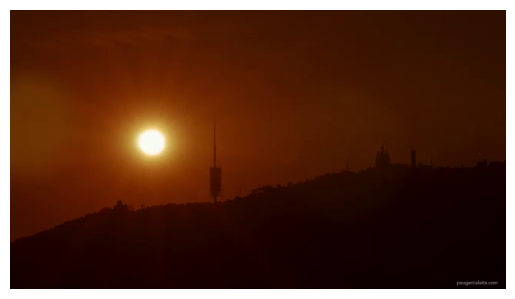

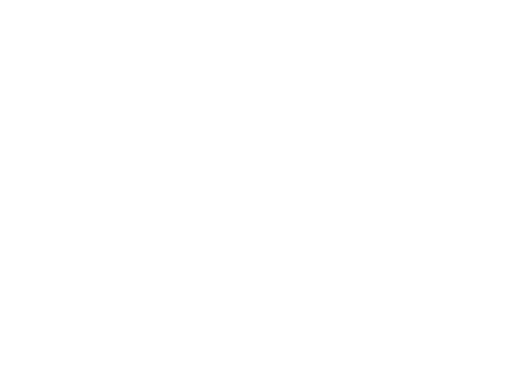

(0.0, 1.0, 0.0, 1.0)

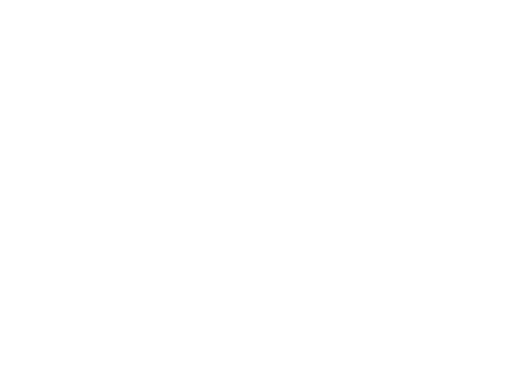

In [105]:
fig = plt.figure()  # Create figure
im = plt.imshow(ic[0], animated=True) #Visualize the first image
plt.axis('off')

def run(i):   #Updating the frame visualization
    im.set_array(ic[i]) #Changing the content of the canvas
    return im, #to return a tuple!

plt.show()
plt.axis('off')
ani = animation.FuncAnimation(fig, run, interval=1, blit=True, frames=len(ic), repeat= False)
plt.show()
plt.axis('off')

a) Find where a shot (scene) finishes and the following starts (the shot boundaries). To achieve this goal, we are going to compute the difference between the histograms of consecutive frames. The proposed solution required:

- Compute the histogram for each RGB channel

- The 'total' histogram of the image is computed as the sum of the three histograms

- Compute the mean of the difference (in absolute value) between the histograms of two consecutive frames

Those differences with largest values corresponds to the transitions between shots. 

Therefore, **we need to create a funtion which return an array with the differences between histograms. We will plot the resulting array in order to localice the maximum values as well as a suitable threshold to define localize the transitions.**

<img src="images_notebook/histogramshot.png" width=600>
<img src="images_notebook/difference_histograms.png">

To solve this exercise, you need to create a **temporal plot** showing a frame by frame difference measure to be defined by you, being applicable to distinguish the shots. Define a criterion to detect the boundaries of the shots and visualize it in a static plot.

The plot above was obtain by using 64 bins histogram and the measure as mean of absolute difference. 

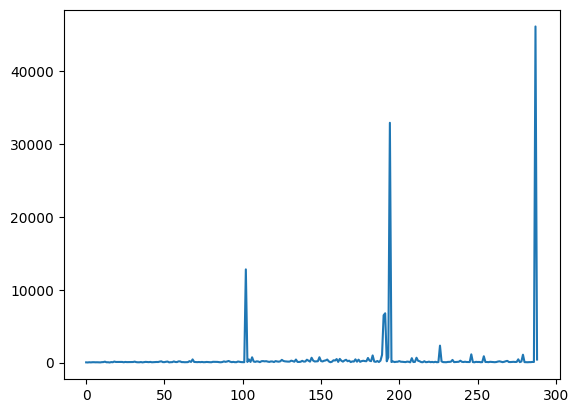

In [115]:
# Your solution here
# this function grabs an image and cast it to float, then
# we return the three histograms one for each RGB channel
def get_RGB_histogram(image, nbins=8):
    image = img_as_float(image)
    return [histogram(image[:, :, rgb], nbins)[0] for rgb in range(3)]

# this functios shows a temporal plot with the mean of the diferences 
# between each histogram of a frame and the next one.
def temporal_plot(images):
    tmp = []

    for i in range(len(images) - 1):
        difference = [abs(get_RGB_histogram(images[i], 8)[rgb] - get_RGB_histogram(images[i+1], 8)[rgb]) for rgb in range (3)]
        tmp.append(np.mean(difference))
    
    plt.plot(tmp)
    plt.show()

temporal_plot(ic)

b) Additionally, create an interactive plot executing the following code in "Example A". Substitute the bottom plot with the temporal plot showing the differences between the consecutive frames. 

In [116]:
# Example A
def data_gen():
    # keep values of histograms of each frame 
    # in list "h" so we can access previous ones
    h = []
    
    t = data_gen.t
    cnt = 0

    while cnt < 1000:       
        # create histogram of "cnt" frame of our "ic" video
        hist = get_RGB_histogram(ic[cnt], 8)
        mean = 0
        # If there are previous histograms in our "h" list
        if len(h) > 0:
            # calculate the difference between current and previous histograms
            dif = [abs(hist[rgb] - h[-1][rgb]) for rgb in range (3)]
            # obtain mean of the difference
            mean = np.mean(dif)
        #add current hist to h list
        h.append(hist)     
        
        cnt+=1
        t += 0.05

        y = mean

        yield t, y

data_gen.t = 0

C:\Users\MariaPérezPulles\AppData\Local\Temp\ipykernel_20076\700528016.py:42: UserWarning: frames=<function data_gen at 0x000001778F9818A0> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  ani = animation.FuncAnimation(fig, run, data_gen, blit=True, interval=10, repeat=False)


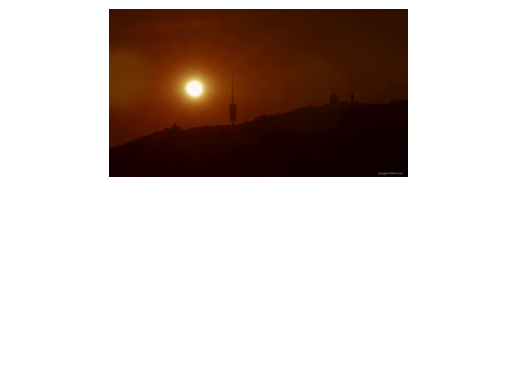

In [117]:
fig, (ax1, ax2) = plt.subplots(2, 1)

# initialize a line object on the second axes for plotting
line, = ax2.plot([], [], lw=2, color='r')

ax2.set_ylim(0, 1.1)
ax2.set_xlim(0, 5)
ax2.grid()

# initialize the data arrays
xdata, ydata = [], []


def run(data):
    # update the data plot
    t, y = data
    xdata.append(t)  # time = x-axis
    ydata.append(y)  # y-axis

    # Plot image on the top row
    ax1.imshow(ic[len(xdata)])
    ax1.axis('off')

    # Plot sin in the bottom row
    xmin, xmax = ax2.get_xlim()
    ymin, ymax = ax2.get_ylim()

    if t >= xmax:
        ax2.set_xlim(xmin, 2 * xmax)
        ax2.figure.canvas.draw()

    if y >= ymax:
        ax2.set_ylim(ymin, 2 * ymax)
        ax2.figure.canvas.draw()

    # update the data of both line objects
    line.set_data(xdata, ydata)

    return line,


ani = animation.FuncAnimation(fig, run, data_gen, blit=True, interval=10, repeat=False)
plt.axis('off')
plt.show()


c) Show the initial and final images of each shot extracted as follows:

<img src="images_notebook/result_shot_detection.png">


Use the previous plot to define the proper threshold value over the differences of histograms. Use the threshold to localize indexes of the array returned by the function proposed in the previous question and, therefore, localize the initial and final frames for each shot as shown in the reference image


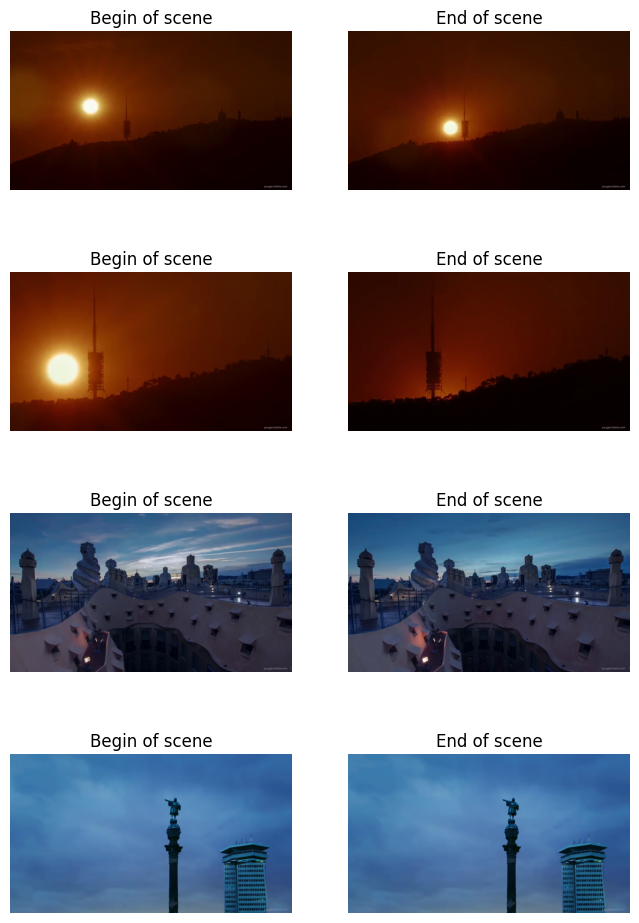

In [180]:
# Your solution here

# When the mean of the differences between
# the three histograms (one for each RGB channel)
# of a frame and its previous (or following)
# is bigger, by default, than 10000 (value  
# chosen by observing the transition between scenes
# in the temporal plot)

def get_scenes(images, threshold = 10000): 

    scenes = [0]
    for i in range(2, len(images)):
        dif = [abs(get_RGB_histogram(images[i], 8)[rgb] - get_RGB_histogram(images[i-1], 8)[rgb]) for rgb in range (3)]
        
        if np.mean(dif) > threshold: # if mean dif is bigger by default, than 10000
            # we put last frame of past scene and first frame of current one
            scenes.append(i - 1)
            scenes.append(i)  
            
    # add the last frame
    scenes.append(i)
    
    return scenes

# The function "show_scenes" takes the indexes 
# of the key frames (when a shot begins or ends)
# we can get with the function "get_scenes" 
# and shows the corresponding frames

def show_scenes(scenes, images):
    fig = plt.figure(figsize=(8,12))
    for p in range(len(scenes)):

        ax = fig.add_subplot(len(scenes)//2, 2, p + 1)
        plt.imshow(images[scenes[p]])
        plt.axis('off')

        if p % 2 == 0:
            ax.title.set_text("Begin of scene")
        else:
            ax.title.set_text("End of scene")

scenes = get_scenes(ic)
show_scenes(scenes, ic)

**d) Which measure have you used in order to visually distinguish the shots in a plot? Explain your solution.**
- Thanks to the temporal plot we were able to see that value to determine were a shot is different from another, should be over 300 therefore we were able to detect 3 differen scens

It is also normal to see this change because the difference between the 2 scenes is very marked and values less than this will not be relevant to detect scenes.

**e) Would your video segmentation strategy be able to separate and track objects? Argue your answer.**
- Yes to a certain degree because to track or extract objects we need to detect the background, thanks to this strategy we can detect a background in movement and extract and object We could also detect an object with the histogram but this would be inefficient because we only see how much color there is in a scene, not the object itself

**f) Would your video segmentation strategy be able to capture continuous transition? Argue your answer.**
- Probably not since our strategy keeps track of meaningful differences between images, if a transition is very smooth, we won´t be able to track the different scenes

#### 

Yes to a certain degree because to track or extract objects we need to detect the background, thanks to this strategy we can detect a background in movement and extract and object We could also detect an object with the histogram but this would be inefficient because we only see how much color there is in a scene, not the object itself


#### 

Probably not since our strategy keeps track of meaningful differences between images, if a transition is very smooth, we won´t be able to track the different scenes

## 3.4 Background subtraction

Apply the background subtraction algorithm (check theory material).

<img src="images_notebook/screenshot2.png" width=500>

a) Visualize the following images for each different scene of the video:

    1) an image belonging to the shot
    2) the background image, and
    3) the foreground.
    
**Hint**: You can construct a mask obtained from the original image and the background in order to know which parts of the image form part from the foreground and recover from the original image just the foreground regions.

In [120]:
# Your solution here
# This function will plot the original, background and foreground image
def show_imgs(original, background, foregorund, scene_num):
    '''
    we made this function to show orig, 
    background and foreground images of scenes
    '''
    # create plot
    fig, axis = plt.subplots(1,3, figsize=(15,15))    
    
    # original image
    axis[0].imshow(original, cmap='gray') 
    axis[0].set_title("Original img " + str(scene_num))    
    axis[0].axis('off')
    
    # background image
    axis[1].imshow(background, cmap='gray') 
    axis[1].set_title("Background Image " + str(scene_num))    
    axis[1].axis('off')
    
    # foreground image
    axis[2].imshow(foregorund, cmap="gray") 
    axis[2].set_title("Foreground Image " + str(scene_num))
    axis[2].axis('off')
    
    plt.show() 

# This function will get the background and extract the foreground
def get_background_foreground(images,start, finish, threshold = 0.1):
    '''
    this function extracts de foreground
    '''
    # Create a black background
    bgrnd = np.zeros(images[0].shape)
    # List with all the images of the scenes
    frames = []
    # List to save float images of each channel
    frames_channels = [[],[],[]]
    
    # Iterate over all frames
    for i in range(start, finish+1):
        # cast all frames to float
        frames.append(img_as_float(images[i]))
        
        # cast all channels to float
        for j in range(3):
            frames_channels[j] += [img_as_float(images[i][:, :, j])]
    
    # median of all frames
    for i in range(3):
        bgrnd[:,:,i] = np.median(frames_channels[i], axis=0)
    
    # To get foreground we have to remove background
    fgrnd = np.abs(frames[0] - bgrnd)
    # convert image to grayscale
    fgrnd_gray = rgb2gray(fgrnd)
    # Binarize foreground (to see it better)
    fgrnd_gray[fgrnd_gray <= threshold] = 0
    fgrnd_gray[fgrnd_gray > threshold] = 1
    
    fgrnd_gray = rgb2gray(fgrnd)
    
    return bgrnd, fgrnd, fgrnd_gray

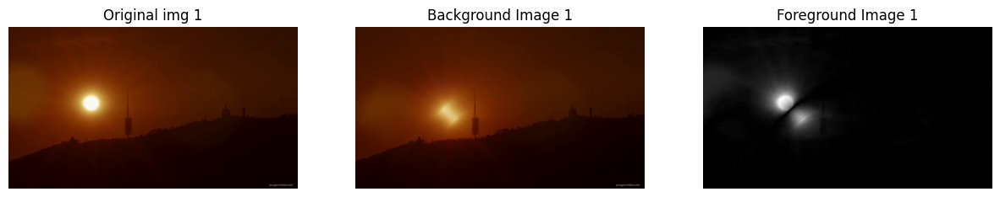

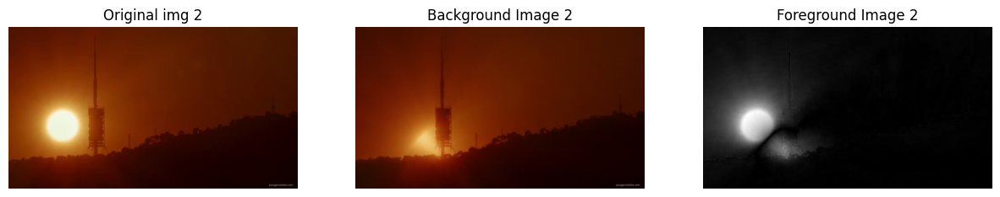

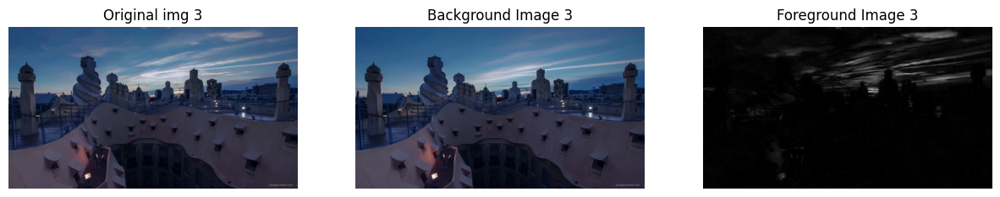

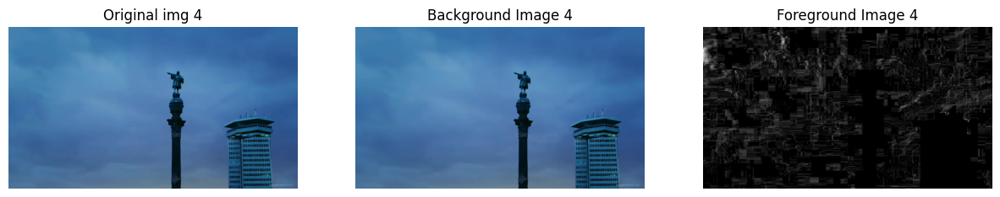

In [121]:
'''
scenes = find_boundaries(ic) # Return the indexes of each scene
pair_scenes=[[scenes[i],scenes[i+1]] for i in range(0,len(scenes),2)]

for i in range(len(pair_scenes)):
    visualize_image_group_3(background(pair_scenes[i]))
'''

%matplotlib inline

# Scene counter
num = 1
# Get all the scenes of the video
scenes = get_scenes(ic, 10000)

for i in range(0, len(scenes), 2):
    # background, foreground and foreground in gray levels
    bg, fg, aux = get_background_foreground(ic, scenes[i], scenes[i+1], 0.2)
    # Plot results
    show_imgs(ic[scenes[i]], bg, aux, num)
    num += 1

**b) What do the static background images represent?**
- The mean value of all the scenes, with a median filter we could say it is the image where the pixels are the same in each image of the scene.

**c) What happens if the shots are not correctly extracted? And, what happens if you find too many shots in the video?**
- After testing it, we saw the results wouldn’t affect and this makes some sense because to get the background, we process many images and get the mean of all, therefore getting a FEW extra images outside the scene wouldn’t affect too much.

**d) What happens if you subtract the background image from the original one?**
- We would get the foreground.

**e) In which situations does the algorithm work and in which it does not? Do you see any additional application for this algorithm?**
- This algorithm works only with static backgrounds; it wouldn’t work if the background keeps changing (or continuous/fluid transitions). A good application of this algorithm will be to get the movement in the foreground of people or objects.

**f) Visualize the highest and lowest similarity frame with respect to the foreground images of each scene. You can use the metric of your like, explain why you picked it.**


In [ ]:
# Your solution here
